# Feature Selection

## Load Python Paclages

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import matplotlib.lines as mlines

## Load Dataset

In [8]:
data = pd.read_csv("final_data_product.csv")

In [5]:
data

,lap_id,invalid_lap,BPS_SPEED,BPS_THROTTLE,BPS_STEER,BPS_BRAKE,BPS_CURRENTLAPTIMEINMS,BPS_LAPDISTANCE,BPS_WORLDPOSITIONX,BPS_WORLDPOSITIONY,...,dist_530_YAW,dist_530_PITCH,dist_530_ROLL,dist_530_left_dist,dist_530_right_dist,dist_530_dist_apex_1,dist_530_dist_apex_2,dist_530_angle_to_apex1,dist_530_angle_to_apex2,dist_530_proj_from_ref
0,10021698834789871149_1,1,316.0,1.000000,0.074568,0.0,2615.0,223.0,274.071987,313.458779,...,-2.715189,0.000475,-0.016953,1.741342,10.851370,132.666175,33.599712,-177.333510,-157.363838,3.100772
1,10021698834789871149_10,1,324.0,0.970802,0.000464,0.0,3097.0,273.0,310.096901,278.846172,...,-2.677639,-0.002429,-0.010994,5.229576,7.362893,134.315712,34.235318,-178.276773,-162.785343,0.365266
2,10021698834789871149_11,1,322.0,1.000000,-0.002375,0.0,2976.0,258.0,298.743940,288.688005,...,-2.672484,-0.003209,-0.015086,4.491344,8.101110,133.962370,34.073817,-177.906287,-161.483133,0.368740
3,10021698834789871149_12,0,322.0,0.025177,0.006011,0.0,3049.0,269.0,307.165908,281.569461,...,-2.683784,-0.003549,-0.013458,4.000375,8.592165,133.726732,33.972230,-177.665140,-160.617290,0.856654
4,10021698834789871149_13,1,324.0,1.000000,0.021114,0.0,3046.0,268.0,306.397540,282.215448,...,-2.576070,0.002121,-0.016932,5.969796,6.622633,134.674490,34.413890,-179.086529,-164.518584,1.101108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,9874269645241895165_2,1,144.0,0.000000,-0.525250,0.0,6234.0,450.0,369.369267,134.915112,...,-2.670881,0.003020,-0.000062,0.781471,11.886334,128.781581,29.677781,-178.004607,-156.571125,3.664728
1028,9941972541231747669_1,1,324.0,1.000000,0.000000,0.0,2979.0,263.0,302.615240,285.497492,...,-2.689289,-0.003212,-0.016119,2.482649,10.109993,133.011217,33.706067,-177.128822,-158.125436,2.364715
1029,9941972541231747669_2,0,324.0,1.000000,-0.000000,0.0,3014.0,264.0,303.184481,284.646456,...,-2.691542,-0.003572,-0.011709,3.187732,9.404851,133.342247,33.821835,-177.350536,-159.259773,1.664493
1030,9948558370850722411_1,1,324.0,1.000000,-0.003344,0.0,3149.0,276.0,301.987594,286.287858,...,-2.532977,0.004081,-0.015205,1.779133,10.876460,130.089505,30.731174,-178.246422,-158.331977,2.772034


In [18]:
# Print name of all columns
for i, col in enumerate(data.columns, 1):
    print(f"{col}")

lap_id
invalid_lap
BPS_SPEED
BPS_THROTTLE
BPS_STEER
BPS_BRAKE
BPS_CURRENTLAPTIMEINMS
BPS_LAPDISTANCE
BPS_WORLDPOSITIONX
BPS_WORLDPOSITIONY
BPS_WORLDFORWARDDIRX
BPS_WORLDFORWARDDIRY
BPS_YAW
BPS_PITCH
BPS_ROLL
BPS_left_dist
BPS_right_dist
BPS_dist_apex_1
BPS_dist_apex_2
BPS_angle_to_apex1
BPS_angle_to_apex2
BPS_proj_from_ref
BPS_ext_LAPDISTANCE
BPS_ext_TIMETOINMS
BPE_SPEED
BPE_THROTTLE
BPE_STEER
BPE_BRAKE
BPE_CURRENTLAPTIMEINMS
BPE_LAPDISTANCE
BPE_WORLDPOSITIONX
BPE_WORLDPOSITIONY
BPE_WORLDFORWARDDIRX
BPE_WORLDFORWARDDIRY
BPE_YAW
BPE_PITCH
BPE_ROLL
BPE_left_dist
BPE_right_dist
BPE_dist_apex_1
BPE_dist_apex_2
BPE_angle_to_apex1
BPE_angle_to_apex2
BPE_proj_from_ref
BPE_ext_LAPDISTANCE
BPE_ext_TIMETOINMS
THS_SPEED
THS_THROTTLE
THS_STEER
THS_BRAKE
THS_CURRENTLAPTIMEINMS
THS_LAPDISTANCE
THS_WORLDPOSITIONX
THS_WORLDPOSITIONY
THS_WORLDFORWARDDIRX
THS_WORLDFORWARDDIRY
THS_YAW
THS_PITCH
THS_ROLL
THS_left_dist
THS_right_dist
THS_dist_apex_1
THS_dist_apex_2
THS_angle_to_apex1
THS_angle_to_apex2
THS

## NaN values in each variable

In [13]:
# Missing count per column
missing_counts = data.isna().sum().sort_values(ascending=False)

pd.set_option('display.max_rows', None)
pd.set_option('display.width', 200)
pd.set_option('display.max_columns', None)
print(missing_counts)

# Total rows with any missing value
rows_with_any_na = data.isna().any(axis=1).sum()
print(f"\nTotal rows with at least one missing value: {rows_with_any_na} / {len(data)}")

STE_ROLL                       189
STE_left_dist                  189
STE_right_dist                 189
STE_dist_apex_1                189
STE_YAW                        189
STE_WORLDFORWARDDIRX           189
STE_WORLDFORWARDDIRY           189
STE_BRAKE                      189
STE_CURRENTLAPTIMEINMS         189
STE_dist_apex_2                189
STE_angle_to_apex1             189
STE_angle_to_apex2             189
STE_ext_TIMETOINMS             189
STE_ext_LAPDISTANCE            189
STE_proj_from_ref              189
STE_PITCH                      189
STE_SPEED                      189
STE_LAPDISTANCE                189
STE_WORLDPOSITIONX             189
STE_WORLDPOSITIONY             189
STE_THROTTLE                   189
STE_STEER                      189
STM_WORLDPOSITIONY             145
STM_BRAKE                      145
STM_WORLDPOSITIONX             145
STM_ROLL                       145
STM_right_dist                 145
STM_YAW                        145
STM_WORLDFORWARDDIRY

## Target Variable

In [8]:
TARGET = "Target_CURRENTLAPTIMEINMS"

## Boxplot Target

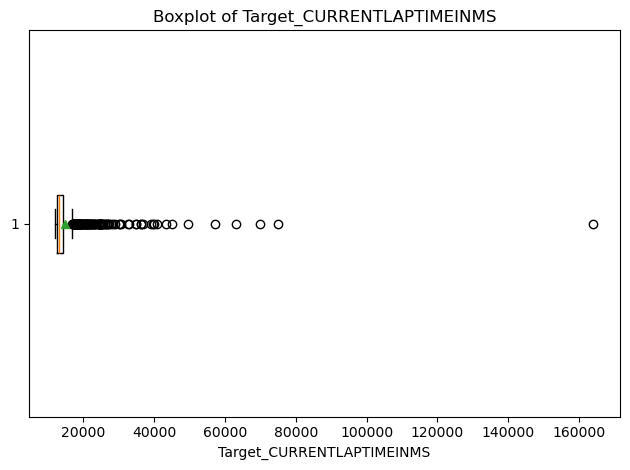

In [15]:
vals = data[TARGET].dropna()

plt.figure()
plt.boxplot(vals, vert=False, showmeans=True)
plt.xlabel(TARGET)
plt.title(f"Boxplot of {TARGET}")
plt.tight_layout()
plt.show()

In [16]:
Q1 = vals.quantile(0.25)
Q3 = vals.quantile(0.75)
IQR = Q3 - Q1
lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

outlier_mask = (data[TARGET] < lower) | (data[TARGET] > upper)
n_outliers = int(outlier_mask.sum())
n_total = int(data[TARGET].notna().sum())

print(f"IQR summary for {TARGET}:")
print(f" Q1={Q1:.3f}, Q3={Q3:.3f}, IQR={IQR:.3f}")
print(f" Lower fence={lower:.3f}, Upper fence={upper:.3f}")
print(f" Outliers: {n_outliers} of {n_total} non-missing rows "
      f"({(n_outliers/max(n_total,1))*100:.2f}%)")

IQR summary for Target_CURRENTLAPTIMEINMS:
 Q1=12637.750, Q3=14318.000, IQR=1680.250
 Lower fence=10117.375, Upper fence=16838.375
 Outliers: 118 of 1032 non-missing rows (11.43%)


## Remove Outliers
I don't think we should include the lap that have very poor performance in lap time

In [17]:
data_rmv_olrs = data.loc[data[TARGET] <= 16838.375].copy()

## Invalid lap performance

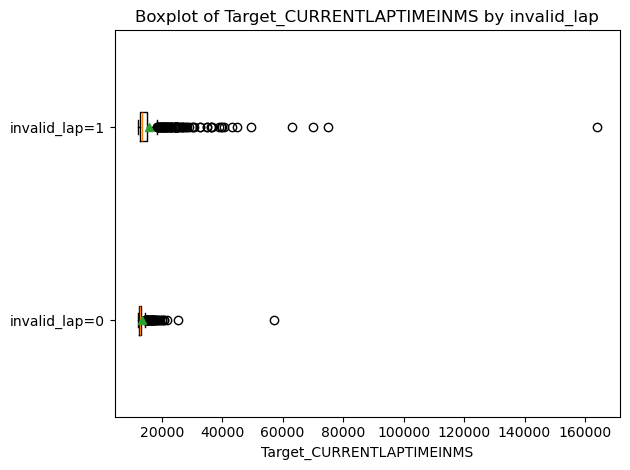

In [18]:
# Boxplot
data_valid = data.loc[data['invalid_lap'] == 0, TARGET].dropna()
data_invalid = data.loc[data['invalid_lap'] == 1, TARGET].dropna()

plt.figure()
plt.boxplot([data_valid, data_invalid], vert=False, showmeans=True)
plt.yticks([1, 2], ["invalid_lap=0", "invalid_lap=1"])
plt.xlabel(TARGET)
plt.title(f"Boxplot of {TARGET} by {'invalid_lap'}")
plt.tight_layout()
plt.show()

In [19]:
GROUP = "invalid_lap"
counts = data[GROUP].dropna().value_counts().reindex([0, 1])
total = int(counts.sum())
perc = (counts / max(total, 1) * 100).round(2)

summary = pd.DataFrame({
    "label": ["valid (0)", "invalid (1)"],
    "count": [int(counts.loc[0]), int(counts.loc[1])],
    "percent": [float(perc.loc[0]), float(perc.loc[1])]
})

print(f"Total rows with {GROUP} in [0,1]: {total}")
print(summary.to_string(index=False))

Total rows with invalid_lap in [0,1]: 1032
      label  count  percent
  valid (0)    400    38.76
invalid (1)    632    61.24


## Scatter Plot

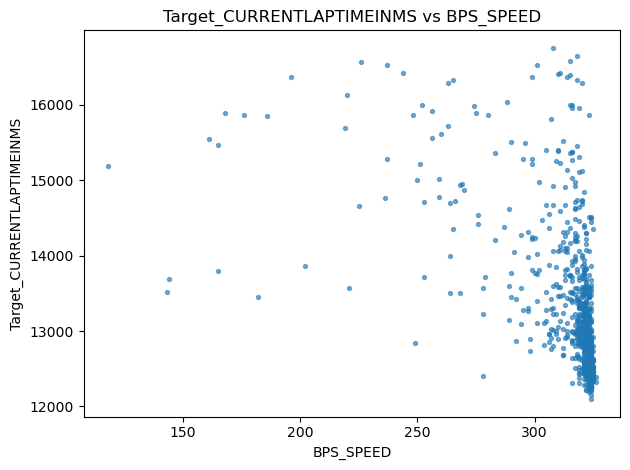

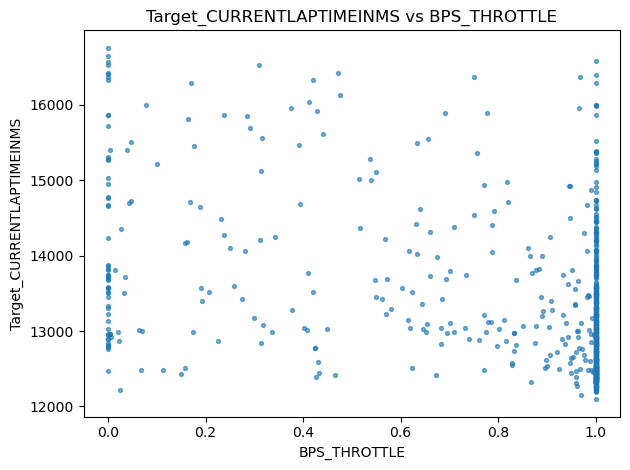

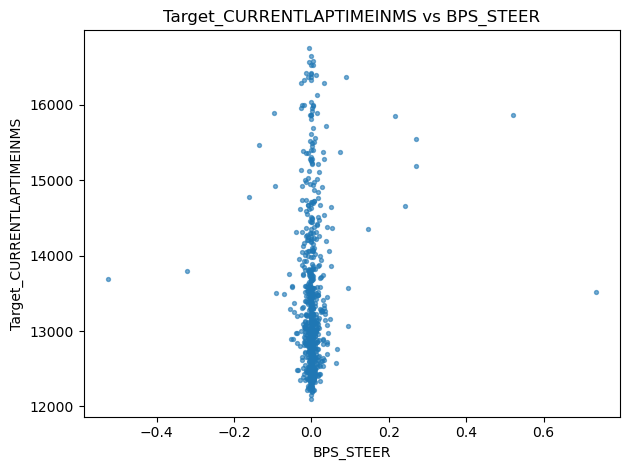

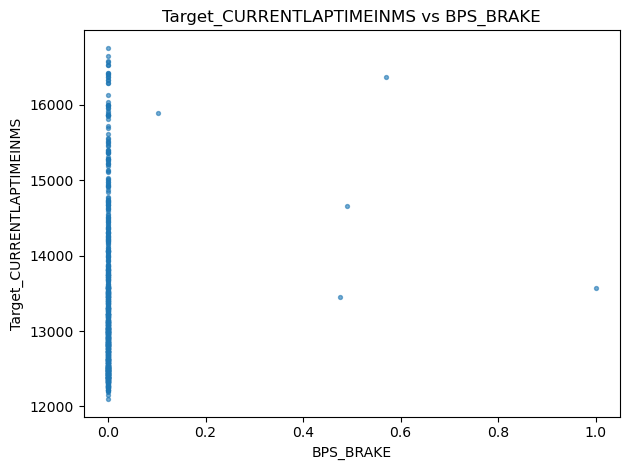

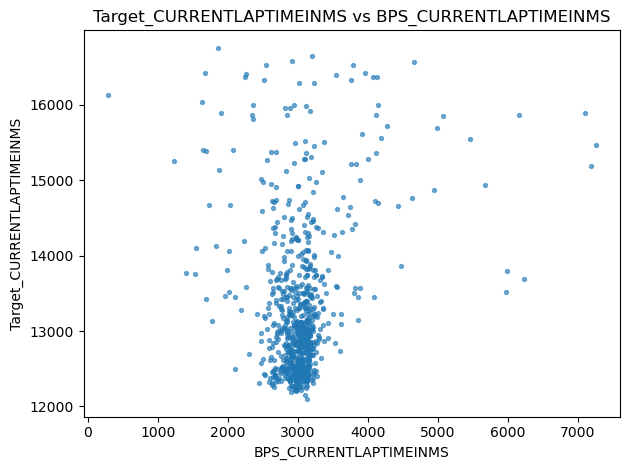

...

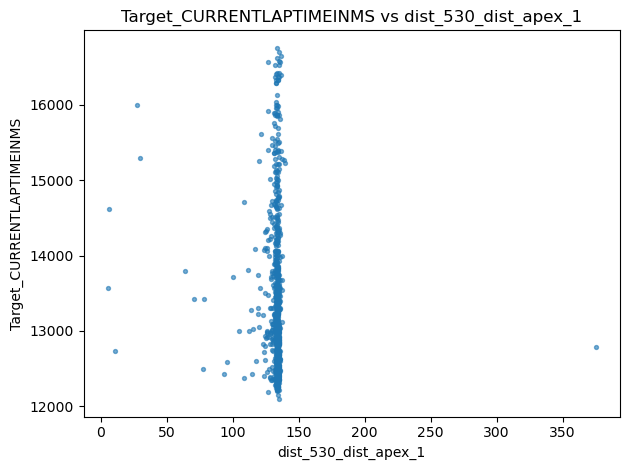

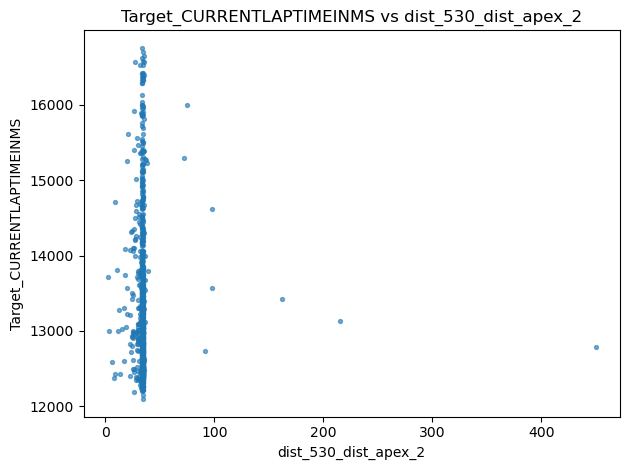

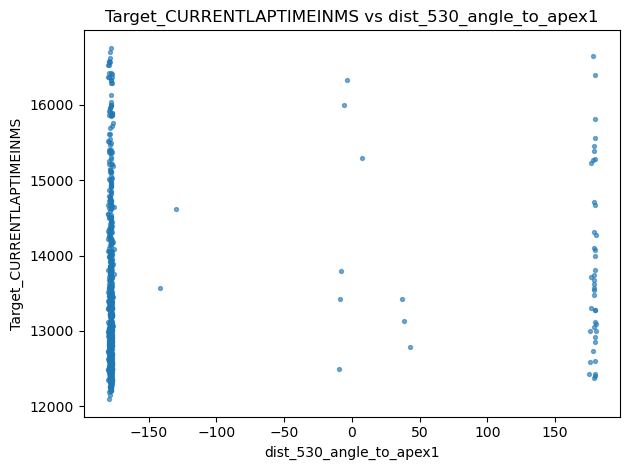

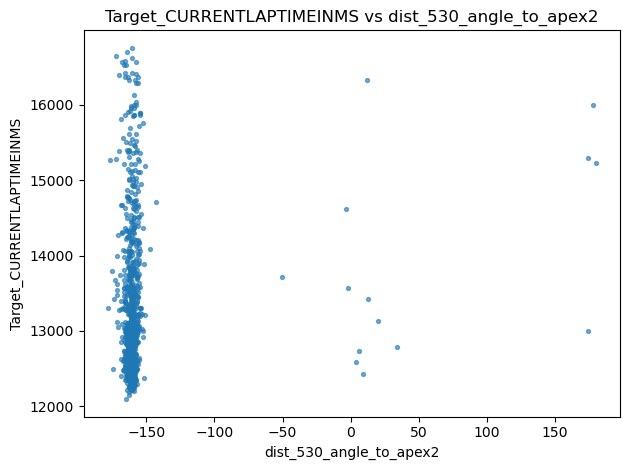

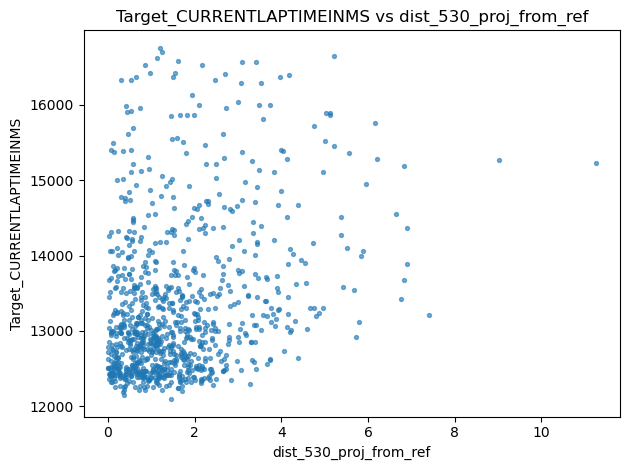

In [20]:
features = [
    c for c in data_rmv_olrs.columns
    if c != TARGET and c.lower() not in {"lap_id", "invalid_lap"}
]

for col in features:
    tmp = data_rmv_olrs[[col, TARGET]].dropna()
    plt.figure()
    plt.scatter(tmp[col], tmp[TARGET], s=8, alpha=0.6)
    plt.xlabel(col)
    plt.ylabel(TARGET)
    plt.title(f"{TARGET} vs {col}")
    plt.tight_layout()
    plt.show()

## Try to Find Significant Features

In [25]:
from scipy.stats import linregress
from statsmodels.stats.multitest import multipletests

# Simple ols for each feature
rows = []
for col in features:
    xy = data[[col, TARGET]].dropna()
    # need at least 3 points and some variation
    if len(xy) < 3 or xy[col].nunique() < 2:
        continue
    res = linregress(xy[col].values, xy[TARGET].values)
    rows.append({
        "feature": col,
        "n": len(xy),
        "slope": res.slope,
        "intercept": res.intercept,
        "pearson_r": res.rvalue,
        "R2": res.rvalue**2,
        "p_value": res.pvalue,
        "std_err_slope": res.stderr
    })

results = pd.DataFrame(rows).sort_values("p_value", ascending=True)

# Multiple testing correction
if not results.empty:
    reject, p_adj, _, _ = multipletests(results["p_value"].values, alpha=0.05, method="fdr_bh")
    results["p_value_adj"] = p_adj
    results["significant_FDR_0.05"] = reject

# Show
print("\nTop 20 features by raw p-value (lower is stronger evidence):")
print(results.head(20)[["feature","n","slope","pearson_r","R2","p_value","p_value_adj","significant_FDR_0.05"]])


Top 20 features by raw p-value (lower is stronger evidence):
                         feature     n          slope  pearson_r        R2        p_value    p_value_adj  significant_FDR_0.05
114       STM_CURRENTLAPTIMEINMS   887       1.462696   0.866880  0.751481  8.652699e-270  2.154522e-267                  True
134       STE_CURRENTLAPTIMEINMS   843       1.419530   0.862931  0.744650  1.598051e-251  1.989573e-249                  True
234  dist_530_CURRENTLAPTIMEINMS  1032       1.916460   0.815895  0.665685  2.653110e-247  2.202081e-245                  True
92        STS_CURRENTLAPTIMEINMS   901       1.680403   0.825295  0.681111  2.476302e-225  1.541498e-223                  True
109           STS_ext_TIMETOINMS   901       4.482087   0.678283  0.460067  1.903768e-122  9.480764e-121                  True
26        BPE_CURRENTLAPTIMEINMS   896       1.926376   0.657566  0.432393  4.643493e-112  1.927050e-110                  True
176      APX2_CURRENTLAPTIMEINMS  1032       1.49

In [23]:
from scipy.stats import linregress, spearmanr
from statsmodels.stats.multitest import multipletests
from sklearn.feature_selection import mutual_info_regression

rows = []
for col in features:
    tmp = data[[col, TARGET]].replace([np.inf, -np.inf], np.nan).dropna()
    if len(tmp) < 5 or tmp[col].nunique() < 2:
        continue

    x = tmp[col].to_numpy()
    y = tmp[TARGET].to_numpy()

    # Linear (Pearson-based OLS slope test)
    lr = linregress(x, y)
    pearson_r = lr.rvalue
    p_pearson = lr.pvalue
    R2_lin = pearson_r ** 2

    # Monotonic (Spearman)
    rho, p_spearman = spearmanr(x, y)

    # General non-linear (Mutual Information)
    mi = mutual_info_regression(x.reshape(-1, 1), y, random_state=42)[0]

    rows.append({
        "feature": col,
        "n": len(tmp),
        "pearson_r": pearson_r,
        "p_pearson": p_pearson,
        "R2_lin": R2_lin,
        "spearman_rho": rho,
        "p_spearman": p_spearman,
        "mutual_info": mi
    })

results = pd.DataFrame(rows)

# Multiple-testing correction (FDR) for p-values
if not results.empty:
    for pcol in ["p_pearson", "p_spearman"]:
        reject, p_adj, _, _ = multipletests(results[pcol].values, alpha=0.05, method="fdr_bh")
        results[pcol.replace("p_", "") + "_p_adj"] = p_adj
        results[pcol.replace("p_", "") + "_sig_FDR_0.05"] = reject

# Show
print("\nTop 20 by Spearman (monotonic strength):")
print(results.sort_values("spearman_p_adj").head(20)[
    ["feature","n","spearman_rho","spearman_p_adj","spearman_sig_FDR_0.05","mutual_info","R2_lin","pearson_r","pearson_p_adj"]
])


Top 20 by Spearman (monotonic strength):
                         feature     n  spearman_rho  spearman_p_adj  spearman_sig_FDR_0.05  mutual_info    R2_lin  pearson_r  pearson_p_adj
234  dist_530_CURRENTLAPTIMEINMS  1032      0.907754    0.000000e+00                   True     1.601564  0.665685   0.815895  2.202081e-245
230               dist_530_SPEED   902     -0.906809    0.000000e+00                   True     0.853903  0.264493  -0.514289   1.476418e-60
172                   APX2_SPEED   902     -0.892268   3.889264e-311                   True     0.860550  0.263293  -0.513121   2.740472e-60
176      APX2_CURRENTLAPTIMEINMS  1032      0.842525   3.278953e-277                   True     1.198831  0.317435   0.563414   6.011855e-86
110                    STM_SPEED   887     -0.782796   8.094877e-183                   True     0.606053  0.257822  -0.507762   6.564274e-58
130                    STE_SPEED   843     -0.794544   8.770006e-183                   True     0.655914  0.2656

In [24]:
# Random Forest
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer

TOPK = 30
X = data[features].copy()
y = data[TARGET].copy()

# Pipeline: impute (median) -> RandomForest
numeric_pre = make_pipeline(SimpleImputer(strategy="median"))
pre = ColumnTransformer([("num", numeric_pre, features)], remainder="drop")

rf = RandomForestRegressor(
    n_estimators=600,
    max_depth=None,
    random_state=42,
    n_jobs=-1
)

pipe = make_pipeline(pre, rf)

# Fit once to get (Gini) feature importances
pipe.fit(X, y)
rf_fitted = pipe.named_steps["randomforestregressor"]

importances = pd.Series(rf_fitted.feature_importances_, index=features)
imp_sorted = importances.sort_values(ascending=False)

print(f"\nTop {TOPK} Random Forest feature importances:")
print(imp_sorted.head(TOPK).to_string())

# Quick model quality: 5-fold CV RMSE
cv = KFold(n_splits=5, shuffle=True, random_state=42)
neg_mse = cross_val_score(
    pipe, X, y,
    scoring="neg_mean_squared_error",
    cv=cv,
    n_jobs=-1
)
rmse = np.sqrt(-neg_mse)
print("\n5-fold CV RMSE:")
print("Fold RMSEs:", np.round(rmse, 3))
print("Mean RMSE :", np.round(rmse.mean(), 3))
print("Std  RMSE :", np.round(rmse.std(), 3))


Top 30 Random Forest feature importances:
STE_CURRENTLAPTIMEINMS         0.269356
dist_530_CURRENTLAPTIMEINMS    0.116878
STM_CURRENTLAPTIMEINMS         0.084874
dist_530_SPEED                 0.062280
STM_SPEED                      0.051117
APX2_CURRENTLAPTIMEINMS        0.041462
STE_SPEED                      0.024701
STS_CURRENTLAPTIMEINMS         0.022697
APX2_WORLDFORWARDDIRX          0.021832
APX2_right_dist                0.019668
BPS_SPEED                      0.018309
STS_ext_TIMETOINMS             0.016159
STS_ROLL                       0.015525
STE_ROLL                       0.013748
STS_SPEED                      0.013696
BPE_CURRENTLAPTIMEINMS         0.011933
BPS_dist_apex_2                0.007591
APX2_PITCH                     0.004654
STS_right_dist                 0.004589
APX2_WORLDFORWARDDIRY          0.003706
dist_530_WORLDFORWARDDIRX      0.003509
APX2_SPEED                     0.003139
dist_530_WORLDPOSITIONY        0.003087
STS_ext_LAPDISTANCE            0.0029

## Remove Uncontrolable Features

_Currentlaptimeinms for all fixed distance

## Drop columns

In [6]:
DROPPED = [
    "dist_360_SPEED", "dist_360_THROTTLE", "dist_360_STEER", "dist_360_BRAKE",
    "dist_360_CURRENTLAPTIMEINMS", "dist_360_LAPDISTANCE", "dist_360_WORLDPOSITIONX", "dist_360_WORLDPOSITIONY",
    "dist_360_WORLDFORWARDDIRX", "dist_360_WORLDFORWARDDIRY", "dist_360_YAW", "dist_360_PITCH",
    "dist_360_ROLL", "dist_360_left_dist", "dist_360_right_dist", "dist_360_dist_apex_1",
    "dist_360_dist_apex_2", "dist_360_angle_to_apex1", "dist_360_angle_to_apex2", "dist_360_proj_from_ref",
    "dist_430_SPEED", "dist_430_THROTTLE", "dist_430_STEER", "dist_430_BRAKE",
    "dist_430_CURRENTLAPTIMEINMS", "dist_430_LAPDISTANCE", "dist_430_WORLDPOSITIONX", "dist_430_WORLDPOSITIONY",
    "dist_430_WORLDFORWARDDIRX", "dist_430_WORLDFORWARDDIRY", "dist_430_YAW", "dist_430_PITCH",
    "dist_430_ROLL", "dist_430_left_dist", "dist_430_right_dist", "dist_430_dist_apex_1",
    "dist_430_dist_apex_2", "dist_430_angle_to_apex1", "dist_430_angle_to_apex2", "dist_430_proj_from_ref",
    "dist_530_SPEED", "dist_530_THROTTLE", "dist_530_STEER", "dist_530_BRAKE",
    "dist_530_CURRENTLAPTIMEINMS", "dist_530_LAPDISTANCE", "dist_530_WORLDPOSITIONX", "dist_530_WORLDPOSITIONY",
    "dist_530_WORLDFORWARDDIRX", "dist_530_WORLDFORWARDDIRY", "dist_530_YAW", "dist_530_PITCH",
    "dist_530_ROLL", "dist_530_left_dist", "dist_530_right_dist", "dist_530_dist_apex_1",
    "dist_530_dist_apex_2", "dist_530_angle_to_apex1", "dist_530_angle_to_apex2", "dist_530_proj_from_ref",
    "BPS_right_dist", "BPE_right_dist", "THS_right_dist", "THE_right_dist", "STS_right_dist",
    "STM_right_dist", "STE_right_dist", "APX1_right_dist", "APX2_right_dist", "BPS_CURRENTLAPTIMEINMS",
    "BPE_CURRENTLAPTIMEINMS", "THS_CURRENTLAPTIMEINMS", "THE_CURRENTLAPTIMEINMS", "STS_CURRENTLAPTIMEINMS",
    "STM_CURRENTLAPTIMEINMS", "STE_CURRENTLAPTIMEINMS", "APX1_CURRENTLAPTIMEINMS", "APX2_CURRENTLAPTIMEINMS"
    # added all the currentlaptimeinms for each moment as well since thats not controlled by driver - Muhammad
]
data = data.drop(columns=DROPPED).dropna().drop_duplicates()
data = data[data['Target_CURRENTLAPTIMEINMS'] < 60000]
X = data.drop(columns=["lap_id","invalid_lap", "Target_CURRENTLAPTIMEINMS"])
y = data["Target_CURRENTLAPTIMEINMS"]

In [7]:
data

,lap_id,invalid_lap,BPS_SPEED,BPS_THROTTLE,BPS_STEER,BPS_BRAKE,BPS_LAPDISTANCE,BPS_WORLDPOSITIONX,BPS_WORLDPOSITIONY,BPS_WORLDFORWARDDIRX,...,APX2_YAW,APX2_PITCH,APX2_ROLL,APX2_left_dist,APX2_dist_apex_1,APX2_dist_apex_2,APX2_angle_to_apex1,APX2_angle_to_apex2,APX2_proj_from_ref,Target_CURRENTLAPTIMEINMS
0,10021698834789871149_1,1,316.0,1.000000,0.074568,0.0,223.0,274.071987,313.458779,-23579.0,...,-2.906792,0.002597,-0.015706,1.188303,101.216786,1.468423,176.387023,-73.297876,1.243211,15377
1,10021698834789871149_10,1,324.0,0.970802,0.000464,0.0,273.0,310.096901,278.846172,-23824.0,...,-2.975512,-0.004548,-0.010439,1.716472,101.368594,0.941933,178.312192,-68.980181,0.715854,12146
2,10021698834789871149_11,1,322.0,1.000000,-0.002375,0.0,258.0,298.743940,288.688005,-23746.0,...,-2.922204,-0.003019,-0.011373,2.731520,101.668646,0.122973,176.987177,53.851467,0.297512,12220
3,10021698834789871149_12,0,322.0,0.025177,0.006011,0.0,269.0,307.165908,281.569461,-23818.0,...,-2.923212,-0.002735,-0.009557,1.879479,101.417020,0.779785,177.377583,-68.683995,0.553155,12219
4,10021698834789871149_13,1,324.0,1.000000,0.021114,0.0,268.0,306.397540,282.215448,-23831.0,...,-2.824224,0.006822,-0.014098,4.818916,102.315233,2.167787,173.829692,99.915419,2.381417,12881
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,9874269645241895165_2,1,144.0,0.000000,-0.525250,0.0,450.0,369.369267,134.915112,5165.0,...,-2.974651,-0.000140,-0.022406,2.409240,105.101572,7.066486,179.753790,-120.396863,5.033546,13686
1028,9941972541231747669_1,1,324.0,1.000000,0.000000,0.0,263.0,302.615240,285.497492,-23572.0,...,-2.875317,-0.000517,-0.010140,1.617995,101.340908,1.039864,176.906931,-71.039304,0.814210,12490
1029,9941972541231747669_2,0,324.0,1.000000,-0.000000,0.0,264.0,303.184481,284.646456,-23649.0,...,-2.914761,-0.002244,-0.008611,1.437935,101.289007,1.219306,177.457928,-71.360891,0.993987,12326
1030,9948558370850722411_1,1,324.0,1.000000,-0.003344,0.0,276.0,301.987594,286.287858,-24030.0,...,-2.907833,0.001437,-0.014618,2.980371,101.744896,0.340118,175.711551,87.320007,0.545892,13604


# Feature Selection LASSO

Divide into train and test data set

In [10]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(data, test_size = 0.2,random_state=1)

Standarise

In [20]:
features = [c for c in data.columns if c not in {"lap_id", TARGET}]
mu = data[features].mean() # mean for each feature
sigma = data[features].std() # std for each feature

data_std = data.copy()
data_std[features] = (data[features] - mu) / sigma

In [21]:
data_std[features].mean().head()

invalid_lap    -5.813531e-17
BPS_SPEED      -2.196223e-16
BPS_THROTTLE    1.141175e-16
BPS_STEER      -2.153160e-18
BPS_BRAKE      -1.399554e-17
dtype: float64

Check alpha

In [27]:
from sklearn.linear_model import LassoCV

lasso_cv = LassoCV(cv = 5)
lasso_cv.fit(data_std[features],data_std[TARGET])
print(f'LASSO Lambda: {lasso_cv.alpha_}')

C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1151562.0790932178, tolerance: 1098736.8385543942
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1610938.5654149055, tolerance: 1208915.082918182
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1396333.125784874, tolerance: 1208915.082918182
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\LENOVO\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:

LASSO Lambda: 91.04784573551602


In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso

Lasso_reg = Lasso(alpha = 91)
Lasso_reg.fit(data_std[features], data_std[TARGET])
pd.DataFrame(Lasso_reg.coef_.round(3), columns=['Coef'], index=features).T

,invalid_lap,BPS_SPEED,BPS_THROTTLE,BPS_STEER,BPS_BRAKE,BPS_LAPDISTANCE,BPS_WORLDPOSITIONX,BPS_WORLDPOSITIONY,BPS_WORLDFORWARDDIRX,BPS_WORLDFORWARDDIRY,...,APX2_WORLDFORWARDDIRY,APX2_YAW,APX2_PITCH,APX2_ROLL,APX2_left_dist,APX2_dist_apex_1,APX2_dist_apex_2,APX2_angle_to_apex1,APX2_angle_to_apex2,APX2_proj_from_ref
Coef,0.0,-430.635,0.0,-122.227,-0.0,0.0,0.0,-0.0,0.0,-0.0,...,-37.456,0.0,0.0,0.0,0.0,0.0,-0.0,-47.365,0.0,0.0


In [26]:
coefs = pd.Series(Lasso_reg.coef_, index=features)
nonzero = coefs[coefs != 0]

print("\nNon-zero LASSO coefficients:")
print(pd.DataFrame({"feature": nonzero.index, "coef": nonzero.values}).to_string(index=True))


Non-zero LASSO coefficients:
                  feature         coef
0               BPS_SPEED  -430.634840
1               BPS_STEER  -122.226794
2                 BPE_YAW    31.965356
3                BPE_ROLL   121.417148
4         BPE_dist_apex_1   131.454793
5      BPE_angle_to_apex1     2.484644
6       BPE_proj_from_ref    30.757547
7    THS_WORLDFORWARDDIRX    49.843661
8                 THS_YAW    91.963645
9                THS_ROLL   278.419460
10    THS_ext_LAPDISTANCE   -45.341286
11     THS_ext_TIMETOINMS   436.301640
12              THE_SPEED  -765.067019
13              THE_BRAKE     7.581066
14        THE_dist_apex_1   258.533733
15    THE_ext_LAPDISTANCE  -904.876500
16     THE_ext_TIMETOINMS  1220.794680
17           STS_THROTTLE   213.272147
18              STS_STEER  -190.018219
19                STS_YAW   570.696062
20     STS_angle_to_apex1  -418.516561
21     STS_angle_to_apex2  -357.763996
22     STS_ext_TIMETOINMS   239.641188
23              STM_SPEED  -148.48

## Elastic Net

In [40]:
import numpy as np
import pandas as pd

from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import KFold, cross_val_score

TARGET = "Target_CURRENTLAPTIMEINMS"
features = [c for c in data.columns if c not in {"lap_id", TARGET}]

X = data[features].copy()
y = data[TARGET].copy()

pre = ColumnTransformer(
    [("num", make_pipeline(SimpleImputer(strategy="median"), StandardScaler()), features)],
    remainder="drop"
)

enetcv = ElasticNetCV(
    l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
    alphas=None,
    cv=5,
    max_iter=200000,
    tol=1e-3,
    n_jobs=-1,
    random_state=42
)

pipe = make_pipeline(pre, enetcv)

# Fit
pipe.fit(X, y)

best_alpha   = pipe.named_steps["elasticnetcv"].alpha_
best_l1ratio = pipe.named_steps["elasticnetcv"].l1_ratio_
print(f"Best alpha: {best_alpha:.6f} | Best l1_ratio: {best_l1ratio:.3f}")

coef_vec = pipe.named_steps["elasticnetcv"].coef_
coefs = pd.Series(coef_vec, index=features)

tol = 1e-8
nonzero = coefs[~np.isclose(coefs.values, 0.0, atol=tol)]
print(f"\nNon-zero Elastic Net coefficients (|coef| > {tol}): {len(nonzero)}")
print(nonzero.to_frame("coef").to_string())

cv = KFold(n_splits=5, shuffle=True, random_state=42)
enet_final = ElasticNet(alpha=best_alpha, l1_ratio=best_l1ratio,
                        max_iter=200000, tol=1e-3, random_state=42)
pipe_final = make_pipeline(pre, enet_final)

neg_mse = cross_val_score(pipe_final, X, y,
                          scoring="neg_mean_squared_error",
                          cv=cv, n_jobs=-1)
rmse = np.sqrt(-neg_mse)
print("\n5-fold CV RMSE:")
print("Fold RMSEs:", np.round(rmse, 3))
print("Mean RMSE :", np.round(rmse.mean(), 3))
print("Std  RMSE :", np.round(rmse.std(), 3))

Best alpha: 84.963034 | Best l1_ratio: 1.000

Non-zero Elastic Net coefficients (|coef| > 1e-08): 47
                              coef
BPS_SPEED              -426.987362
BPS_STEER              -132.289973
BPS_ext_TIMETOINMS       -9.723860
BPE_YAW                  35.113500
BPE_ROLL                128.064126
BPE_dist_apex_1         136.604056
BPE_angle_to_apex1        7.740298
BPE_proj_from_ref        42.143336
THS_WORLDFORWARDDIRX     64.107855
THS_YAW                  91.221781
THS_ROLL                281.590742
THS_ext_LAPDISTANCE     -70.276166
THS_ext_TIMETOINMS      453.608428
THE_SPEED              -782.332825
THE_BRAKE                15.861652
THE_dist_apex_1         249.065634
THE_ext_LAPDISTANCE    -922.981299
THE_ext_TIMETOINMS     1239.005678
STS_THROTTLE            212.008381
STS_STEER              -192.216186
STS_YAW                 580.339044
STS_left_dist            -2.084104
STS_angle_to_apex1     -421.917471
STS_angle_to_apex2     -365.727529
STS_ext_TIMETOINMS      

In [11]:
# list all kept variables, categorise it based on keyword after first _
from collections import defaultdict

raw = """
BPS_SPEED              -426.987362
BPS_STEER              -132.289973
BPS_ext_TIMETOINMS       -9.723860
BPE_YAW                  35.113500
BPE_ROLL                128.064126
BPE_dist_apex_1         136.604056
BPE_angle_to_apex1        7.740298
BPE_proj_from_ref        42.143336
THS_WORLDFORWARDDIRX     64.107855
THS_YAW                  91.221781
THS_ROLL                281.590742
THS_ext_LAPDISTANCE     -70.276166
THS_ext_TIMETOINMS      453.608428
THE_SPEED              -782.332825
THE_BRAKE                15.861652
THE_dist_apex_1         249.065634
THE_ext_LAPDISTANCE    -922.981299
THE_ext_TIMETOINMS     1239.005678
STS_THROTTLE            212.008381
STS_STEER              -192.216186
STS_YAW                 580.339044
STS_left_dist            -2.084104
STS_angle_to_apex1     -421.917471
STS_angle_to_apex2     -365.727529
STS_ext_TIMETOINMS      239.493311
STM_SPEED              -119.442654
STM_THROTTLE              4.266626
STM_STEER               705.532920
STM_BRAKE               -23.628396
STM_WORLDPOSITIONX     -113.983842
STM_left_dist           -37.224632
STM_dist_apex_1         223.345548
STM_angle_to_apex2     -131.076480
STE_SPEED              -858.716490
STE_THROTTLE           -169.692737
STE_dist_apex_1          22.276897
STE_angle_to_apex2       36.352484
STE_ext_LAPDISTANCE     339.507651
STE_ext_TIMETOINMS     -593.832307
APX1_STEER               32.494466
APX1_WORLDPOSITIONY    -158.222991
APX2_SPEED             -400.149329
APX2_STEER              110.672435
APX2_WORLDFORWARDDIRX   -63.811300
APX2_WORLDFORWARDDIRY   -34.597421
APX2_YAW                  9.722735
APX2_angle_to_apex1     -53.177944
""".strip()

# Extract variable names
vars_only = [line.split()[0] for line in raw.splitlines() if line.strip()]

# Group by substring after the FIRST underscore
by_first_suffix = defaultdict(list)
for v in vars_only:
    if "_" in v:
        key = v.split("_", 1)[1]
    else:
        key = v
    by_first_suffix[key].append(v)

for key in sorted(by_first_suffix):
    print(f"\n== *_{key} ==")
    for name in by_first_suffix[key]:
        print(name)


== *_BRAKE ==
THE_BRAKE
STM_BRAKE

== *_ROLL ==
BPE_ROLL
THS_ROLL

== *_SPEED ==
BPS_SPEED
THE_SPEED
STM_SPEED
STE_SPEED
APX2_SPEED

== *_STEER ==
BPS_STEER
STS_STEER
STM_STEER
APX1_STEER
APX2_STEER

== *_THROTTLE ==
STS_THROTTLE
STM_THROTTLE
STE_THROTTLE

== *_WORLDFORWARDDIRX ==
THS_WORLDFORWARDDIRX
APX2_WORLDFORWARDDIRX

== *_WORLDFORWARDDIRY ==
APX2_WORLDFORWARDDIRY

== *_WORLDPOSITIONX ==
STM_WORLDPOSITIONX

== *_WORLDPOSITIONY ==
APX1_WORLDPOSITIONY

== *_YAW ==
BPE_YAW
THS_YAW
STS_YAW
APX2_YAW

== *_angle_to_apex1 ==
BPE_angle_to_apex1
STS_angle_to_apex1
APX2_angle_to_apex1

== *_angle_to_apex2 ==
STS_angle_to_apex2
STM_angle_to_apex2
STE_angle_to_apex2

== *_dist_apex_1 ==
BPE_dist_apex_1
THE_dist_apex_1
STM_dist_apex_1
STE_dist_apex_1

== *_ext_LAPDISTANCE ==
THS_ext_LAPDISTANCE
THE_ext_LAPDISTANCE
STE_ext_LAPDISTANCE

== *_ext_TIMETOINMS ==
BPS_ext_TIMETOINMS
THS_ext_TIMETOINMS
THE_ext_TIMETOINMS
STS_ext_TIMETOINMS
STE_ext_TIMETOINMS

== *_left_dist ==
STS_left_dist
STM_left

## Working with Non NA Dataset

In [3]:
# Non NA data
nonNA_data = pd.read_csv("new_data.csv")

In [15]:
import numpy as np
import pandas as pd

from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import KFold, cross_val_score

TARGET = "Target_CURRENTLAPTIMEINMS"
features = [c for c in nonNA_data.columns if c not in {"lap_id", TARGET}]

X = nonNA_data[features].copy()
y = nonNA_data[TARGET].copy()

pre = ColumnTransformer(
    [("num", make_pipeline(SimpleImputer(strategy="median"), StandardScaler()), features)],
    remainder="drop"
)

enetcv = ElasticNetCV(
    l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
    alphas=None,
    cv=5,
    max_iter=200000,
    tol=1e-3,
    n_jobs=-1,
    random_state=42
)

pipe = make_pipeline(pre, enetcv)

# Fit
pipe.fit(X, y)

best_alpha   = pipe.named_steps["elasticnetcv"].alpha_
best_l1ratio = pipe.named_steps["elasticnetcv"].l1_ratio_
print(f"Best alpha: {best_alpha:.6f} | Best l1_ratio: {best_l1ratio:.3f}")

coef_vec = pipe.named_steps["elasticnetcv"].coef_
coefs = pd.Series(coef_vec, index=features)

tol = 1e-8
nonzero = coefs[~np.isclose(coefs.values, 0.0, atol=tol)]
print(f"\nNon-zero Elastic Net coefficients (|coef| > {tol}): {len(nonzero)}")
print(nonzero.to_frame("coef").to_string())

cv = KFold(n_splits=5, shuffle=True, random_state=42)
enet_final = ElasticNet(alpha=best_alpha, l1_ratio=best_l1ratio,
                        max_iter=200000, tol=1e-3, random_state=42)
pipe_final = make_pipeline(pre, enet_final)

neg_mse = cross_val_score(pipe_final, X, y,
                          scoring="neg_mean_squared_error",
                          cv=cv, n_jobs=-1)
rmse = np.sqrt(-neg_mse)
print("\n5-fold CV RMSE:")
print("Fold RMSEs:", np.round(rmse, 3))
print("Mean RMSE :", np.round(rmse.mean(), 3))
print("Std  RMSE :", np.round(rmse.std(), 3))

Best alpha: 84.963034 | Best l1_ratio: 1.000

Non-zero Elastic Net coefficients (|coef| > 1e-08): 47
                              coef
BPS_SPEED              -426.987362
BPS_STEER              -132.289973
BPS_ext_TIMETOINMS       -9.723860
BPE_YAW                  35.113500
BPE_ROLL                128.064126
BPE_dist_apex_1         136.604056
BPE_angle_to_apex1        7.740298
BPE_proj_from_ref        42.143336
THS_WORLDFORWARDDIRX     64.107855
THS_YAW                  91.221781
THS_ROLL                281.590742
THS_ext_LAPDISTANCE     -70.276166
THS_ext_TIMETOINMS      453.608428
THE_SPEED              -782.332825
THE_BRAKE                15.861652
THE_dist_apex_1         249.065634
THE_ext_LAPDISTANCE    -922.981299
THE_ext_TIMETOINMS     1239.005678
STS_THROTTLE            212.008381
STS_STEER              -192.216186
STS_YAW                 580.339044
STS_left_dist            -2.084104
STS_angle_to_apex1     -421.917471
STS_angle_to_apex2     -365.727529
STS_ext_TIMETOINMS      

In [19]:
for i, col in enumerate(nonNA_data.columns, 1):
    print(f"{col}")

lap_id
invalid_lap
BPS_SPEED
BPS_THROTTLE
BPS_STEER
BPS_BRAKE
BPS_LAPDISTANCE
BPS_WORLDPOSITIONX
BPS_WORLDPOSITIONY
BPS_WORLDFORWARDDIRX
BPS_WORLDFORWARDDIRY
BPS_YAW
BPS_PITCH
BPS_ROLL
BPS_left_dist
BPS_dist_apex_1
BPS_dist_apex_2
BPS_angle_to_apex1
BPS_angle_to_apex2
BPS_proj_from_ref
BPS_ext_LAPDISTANCE
BPS_ext_TIMETOINMS
BPE_SPEED
BPE_THROTTLE
BPE_STEER
BPE_BRAKE
BPE_LAPDISTANCE
BPE_WORLDPOSITIONX
BPE_WORLDPOSITIONY
BPE_WORLDFORWARDDIRX
BPE_WORLDFORWARDDIRY
BPE_YAW
BPE_PITCH
BPE_ROLL
BPE_left_dist
BPE_dist_apex_1
BPE_dist_apex_2
BPE_angle_to_apex1
BPE_angle_to_apex2
BPE_proj_from_ref
BPE_ext_LAPDISTANCE
BPE_ext_TIMETOINMS
THS_SPEED
THS_THROTTLE
THS_STEER
THS_BRAKE
THS_LAPDISTANCE
THS_WORLDPOSITIONX
THS_WORLDPOSITIONY
THS_WORLDFORWARDDIRX
THS_WORLDFORWARDDIRY
THS_YAW
THS_PITCH
THS_ROLL
THS_left_dist
THS_dist_apex_1
THS_dist_apex_2
THS_angle_to_apex1
THS_angle_to_apex2
THS_proj_from_ref
THS_ext_LAPDISTANCE
THS_ext_TIMETOINMS
THE_SPEED
THE_THROTTLE
THE_STEER
THE_BRAKE
THE_LAPDISTANCE
T

### With selected features

In [1]:
selected_features = [
    "APX1_BRAKE", "APX1_SPEED", "APX1_STEER", "APX1_WORLDFORWARDDIRX",
    "APX1_YAW", "APX1_angle_to_apex2", "APX1_proj_from_ref", "APX2_SPEED",
    "APX2_STEER", "APX2_THROTTLE", "APX2_WORLDPOSITIONY", "APX2_angle_to_apex1",
    "APX2_angle_to_apex2", "APX2_dist_apex_1", "BPE_ROLL", "BPE_STEER",
    "BPE_WORLDFORWARDDIRY", "BPE_YAW", "BPE_angle_to_apex1", "BPE_angle_to_apex2",
    "BPE_ext_TIMETOINMS", "BPE_left_dist", "BPE_proj_from_ref", "BPS_PITCH",
    "BPS_ROLL", "BPS_STEER", "BPS_THROTTLE", "BPS_YAW",
    "BPS_angle_to_apex1", "BPS_ext_TIMETOINMS", "STE_ROLL", "STE_STEER",
    "STE_THROTTLE", "STE_angle_to_apex1", "STE_ext_LAPDISTANCE", "STE_ext_TIMETOINMS",
    "STE_proj_from_ref", "STM_BRAKE", "STM_ROLL", "STM_SPEED",
    "STM_STEER", "STM_WORLDFORWARDDIRY", "STM_YAW", "STM_angle_to_apex1",
    "STM_angle_to_apex2", "STM_left_dist", "STS_BRAKE", "STS_STEER",
    "STS_THROTTLE", "STS_angle_to_apex1", "STS_angle_to_apex2", "STS_ext_TIMETOINMS",
    "STS_proj_from_ref", "THE_BRAKE", "THE_ROLL", "THE_SPEED",
    "THE_WORLDFORWARDDIRX", "THE_YAW", "THE_dist_apex_1", "THE_proj_from_ref",
    "THS_ROLL", "THS_STEER", "THS_THROTTLE", "THS_YAW",
    "THS_proj_from_ref"
]

In [10]:
import numpy as np
import pandas as pd

from sklearn.pipeline import make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV, ElasticNet
from sklearn.model_selection import KFold, cross_val_score

TARGET = "Target_CURRENTLAPTIMEINMS"
X = nonNA_data[selected_features].copy()
y = nonNA_data[TARGET].copy()

pre = ColumnTransformer(
    [("num", make_pipeline(SimpleImputer(strategy="median"), StandardScaler()), selected_features)],
    remainder="drop"
)

enetcv = ElasticNetCV(
    l1_ratio=[0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
    alphas=None,
    cv=5,
    max_iter=200000,
    tol=1e-3,
    n_jobs=-1,
    random_state=42
)

pipe = make_pipeline(pre, enetcv)

# Fit
pipe.fit(X, y)

best_alpha   = pipe.named_steps["elasticnetcv"].alpha_
best_l1ratio = pipe.named_steps["elasticnetcv"].l1_ratio_
print(f"Best alpha: {best_alpha:.6f} | Best l1_ratio: {best_l1ratio:.3f}")

coef_vec = pipe.named_steps["elasticnetcv"].coef_
coefs = pd.Series(coef_vec, index=selected_features)

tol = 1e-8
nonzero = coefs[~np.isclose(coefs.values, 0.0, atol=tol)]
print(f"\nNon-zero Elastic Net coefficients (|coef| > {tol}): {len(nonzero)}")
print(nonzero.to_frame("coef").to_string())

cv = KFold(n_splits=5, shuffle=True, random_state=42)
enet_final = ElasticNet(alpha=best_alpha, l1_ratio=best_l1ratio,
                        max_iter=200000, tol=1e-3, random_state=42)
pipe_final = make_pipeline(pre, enet_final)

neg_mse = cross_val_score(pipe_final, X, y,
                          scoring="neg_mean_squared_error",
                          cv=cv, n_jobs=-1)
rmse = np.sqrt(-neg_mse)
print("\n5-fold CV RMSE:")
print("Fold RMSEs:", np.round(rmse, 3))
print("Mean RMSE :", np.round(rmse.mean(), 3))
print("Std  RMSE :", np.round(rmse.std(), 3))

Best alpha: 3.091285 | Best l1_ratio: 0.900

Non-zero Elastic Net coefficients (|coef| > 1e-08): 64
                             coef
APX1_BRAKE             -62.194178
APX1_SPEED             -58.664899
APX1_STEER              98.648713
APX1_WORLDFORWARDDIRX   55.579617
APX1_YAW               118.733660
APX1_angle_to_apex2   -221.889676
APX1_proj_from_ref      17.656572
APX2_SPEED            -663.317841
APX2_STEER              93.777853
APX2_THROTTLE          -31.606259
APX2_WORLDPOSITIONY   -134.599736
APX2_angle_to_apex1   -204.469795
APX2_angle_to_apex2     17.072459
APX2_dist_apex_1        88.665791
BPE_ROLL               193.149234
BPE_STEER               19.460619
BPE_WORLDFORWARDDIRY    -5.218125
BPE_YAW                156.850504
BPE_angle_to_apex1      77.711733
BPE_angle_to_apex2      62.015967
BPE_ext_TIMETOINMS     192.574288
BPE_left_dist          -22.938874
BPE_proj_from_ref       57.909410
BPS_PITCH              155.226488
BPS_ROLL               190.929914
BPS_STEER       

## Try splitting data

In [12]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error

# Features and target
TARGET = "Target_CURRENTLAPTIMEINMS"
X = nonNA_data[selected_features].copy()
y = nonNA_data[TARGET].copy()

# Split
X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.2, random_state=42)

model = make_pipeline(StandardScaler(with_mean=True, with_std=True), ElasticNet(max_iter=100000))

# Fit on train
model.fit(X_tr, y_tr)

# Predict on test
y_pred = model.predict(X_te)

# RMSE on test
mse = mean_squared_error(y_te, y_pred)
rmse = np.sqrt(mse)
print("Test RMSE:", rmse)

Test RMSE: 3434.4878908712885
